# UFC Exploratory Visual Analysis Part 2

## List of Contents:
## 01. Importing Libraries
## 02. Importing Data
## 03. Removing Variables
## 04. Correlation Matrix Heatmap
## 05. Scatterplots of Strong Correlation Variables With Wins
## 06. Age Categories
## 07. Exporting Data

## --

## 01. Importing Libraries

In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
#Checking version of matplotlib
matplotlib.__version__

'3.7.2'

In [3]:
#Option to display charts without call
%matplotlib inline

In [8]:
#To view all columns of dataset at once
pd.set_option('display.max_columns', 300)

## 02. Importing Data

In [4]:
#Defining path for data import
path = r'C:\Users\Mosspants\Desktop\CareerFoundry\A6_Advanced Analytics & Dashboard Design\UFC_Project'

In [6]:
#Importing data
df_ufc = pd.read_csv(os.path.join(path, '02_Data', 'Prepared_Data', 'ufc_opp_avgs.csv'), index_col=False)

In [9]:
#Checking import
df_ufc.head()

,R_fighter,B_fighter,Referee,location,Winner,title_bout,weight_class,B_avg_KD,B_avg_opp_KD,B_avg_SIG_STR_pct,B_avg_opp_SIG_STR_pct,B_avg_TD_pct,B_avg_opp_TD_pct,B_avg_SUB_ATT,B_avg_opp_SUB_ATT,B_avg_REV,B_avg_opp_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_avg_TD_att,B_avg_TD_landed,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_BODY_att,B_avg_BODY_landed,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_LEG_att,B_avg_LEG_landed,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_CTRL_time(seconds),B_avg_opp_CTRL_time(seconds),B_total_time_fought(seconds),B_total_rounds_fought,B_total_title_bouts,B_current_win_streak,B_current_lose_streak,B_longest_win_streak,B_wins,B_losses,B_draw,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_Stance,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_avg_KD,R_avg_opp_KD,R_avg_SIG_STR_pct,R_avg_opp_SIG_STR_pct,R_avg_TD_pct,R_avg_opp_TD_pct,R_avg_SUB_ATT,R_avg_opp_SUB_ATT,R_avg_REV,R_avg_opp_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_avg_TD_att,R_avg_TD_landed,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_BODY_att,R_avg_BODY_landed,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_LEG_att,R_avg_LEG_landed,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_CTRL_time(seconds),R_avg_opp_CTRL_time(seconds),R_total_time_fought(seconds),R_total_rounds_fought,R_total_title_bouts,R_current_win_streak,R_current_lose_streak,R_longest_win_streak,R_wins,R_losses,R_draw,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_Stance,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age,Day,Month,Year
0,Adrian Yanez,Gustavo Lopez,Chris Tognoni,"Las Vegas, Nevada, USA",Red,False,Bantamweight,0.000,0.0,0.420000,0.49500,0.330,0.36000,0.500,1.0000,0.00,0.0,50.0000,20.0000,84.000,45.0000,76.5000,41.000,114.000,64.00,1.500,1.0,9.0,6.500,39.500,11.000,63.0000,27.500,7.5000,7.0000,12.0000,9.0000,3.000,2.000,9.000,8.500,35.0000,12.5,43.5000,17.5000,10.5000,4.5000,4.0000,3.00,4.5000,3.000,36.50,24.50,34.00,277.5000,531.5000,4,0,0,1,1,1,1,0,0,0,0,0,1,0,Orthodox,165.10,170.18,135,1.000000,0.000000,0.500000,0.460000,0.000000,0.00000,0.000000,0.00000,0.00000,0.00,34.000000,17.000000,13.00000,6.000000,35.000000,18.000000,16.000000,9.000000,0.000000,0.000000,3.000000,0.000000,32.00000,15.000000,11.000000,5.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,33.000000,16.000000,12.000000,6.000000,1.000000,1.000000,1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,54.000000,166.000000,1,0,1,0,1,1,0,0,0,0,0,1,0,0,Orthodox,170.18,177.80,135,31,27,20,3,2021
1,Trevin Giles,Roman Dolidze,Herb Dean,"Las Vegas, Nevada, USA",Red,False,Middleweight,0.500,0.0,0.660000,0.30500,0.300,0.50000,1.500,0.0000,0.00,0.0,65.5000,35.0000,50.000,16.5000,113.5000,68.500,68.500,29.00,2.500,1.5,0.5,0.500,46.000,20.000,36.0000,7.500,12.0000,8.0000,8.0000,3.0000,7.500,7.000,6.000,6.000,58.0000,30.0,48.0000,15.5000,0.5000,0.5000,0.5000,0.50,7.0000,4

## 03. Removing Variables

### This is the expanded version of the previous data set. Previously it seemed like the more a fighter fought, the more they won. We may find more correlations here, with the averages of successful strikes, takedowns, etc.

In [11]:
#Checking data types
df_ufc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5809 entries, 0 to 5808
Columns: 146 entries, R_fighter to Year
dtypes: bool(1), float64(102), int64(35), object(8)
memory usage: 6.4+ MB


In [12]:
#Creating subset without object, bool columns, and date info
df_sub = df_ufc.drop(columns = ['R_fighter', 'B_fighter', 'Referee', 'location', 'Winner', 'title_bout', 'weight_class', 'B_Stance', 'R_Stance', 'Day', 'Month', 'Year'])

In [13]:
df_sub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5809 entries, 0 to 5808
Columns: 134 entries, B_avg_KD to R_age
dtypes: float64(102), int64(32)
memory usage: 5.9 MB


## 04. Correlation Matrix Heatmap

In [14]:
#Creating correlation matrix of subset
df_sub.corr()

,B_avg_KD,B_avg_opp_KD,B_avg_SIG_STR_pct,B_avg_opp_SIG_STR_pct,B_avg_TD_pct,B_avg_opp_TD_pct,B_avg_SUB_ATT,B_avg_opp_SUB_ATT,B_avg_REV,B_avg_opp_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_avg_TD_att,B_avg_TD_landed,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_BODY_att,B_avg_BODY_landed,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_LEG_att,B_avg_LEG_landed,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_CTRL_time(seconds),B_avg_opp_CTRL_time(seconds),B_total_time_fought(seconds),B_total_rounds_fought,B_total_title_bouts,B_current_win_streak,B_current_lose_streak,B_longest_win_streak,B_wins,B_losses,B_draw,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_avg_KD,R_avg_opp_KD,R_avg_SIG_STR_pct,R_avg_opp_SIG_STR_pct,R_avg_TD_pct,R_avg_opp_TD_pct,R_avg_SUB_ATT,R_avg_opp_SUB_ATT,R_avg_REV,R_avg_opp_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_avg_TD_att,R_avg_TD_landed,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_BODY_att,R_avg_BODY_landed,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_LEG_att,R_avg_LEG_landed,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_CTRL_time(seconds),R_avg_opp_CTRL_time(seconds),R_total_time_fought(seconds),R_total_rounds_fought,R_total_title_bouts,R_current_win_streak,R_current_lose_streak,R_longest_win_streak,R_wins,R_losses,R_draw,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_Height_cms,R_Reach_cms,R_Weight_lbs,B_age,R_age
B_avg_KD,1.000000,-0.108346,0.147040,-0.165046,-0.101331,-0.167825,-0.134034,-0.105830,-0.088021,-0.103915,0.010785,0.054299,-0.069871,-0.109096,-0.057090,-0.068133,-0.123944,-0.177522,-0.218568,-0.162387,-0.039585,-0.129034,0.017889,0.081259,-0.066692,-0.112356,-0.015574,-0.006309,-0.067240,-0.082180,-0.010349,-0.002657,-0.035755,-0.040555,0.004019,0.053578,-0.030144,-0.044750,-0.014098,-0.017280,-0.076659,-0.090095,0.050071,0.041987,-0.153589,-0.153454,-0.158483,-0.181184,-0.163035,0.040798,-0.002706,0.124015,-0.100924,0.185393,0.132454,-0.043286,NaN,-0.000036,-0.010669,0.002775,0.311249,-0.065854,0.020805,0.099073,0.111177,0.109418,0.082363,-0.000170,0.081402,-0.024701,-0.013030,-0.060211,-0.029734,-0.045620,-0.037386,-0.050322,0.059106,0.088927,0.016898,0.000064,0.065769,0.084809,0.002389,-0.020133,0.004165,0.014720,0.002973,-0.028179,0.057259,0.091293,0.017467,-0.003015,0.043704,0.054187,0.007067,-0.002714,0.036161,0.044272,0.010952,0.011985,0.043836,0.068329,0.027969,0.019512,0.021453,0.024817,-0.012047,-0.017901,0.069496,0.071054,-0.046110,-0.046245,0.024556,-0.052748,0.043657,0.100453,0.078562,0.107296,-0.036287,0.153047,0.141660,0.016808,NaN,0.043726,0.036041,0.102580,0.136799,0.047118,0.028628,0.085094,0.099211,0.100739,-0.003593,0.056525
B_avg_opp_KD,-0.108346,1.000000,-0.131048,0.195536,-0.086833,-0.046862,-0.082928,-0.058428,-0.044906,-0.049158,-0.075047,-0.105919,-0.005021,0.053807,-0.112742,-0.148483,-0.044479,-0.025455,-0.02461

In [15]:
#Assigning matrix
matrix = df_sub.corr()

In [16]:
#Exporting matrix to clipboard to save
matrix.to_clipboard()

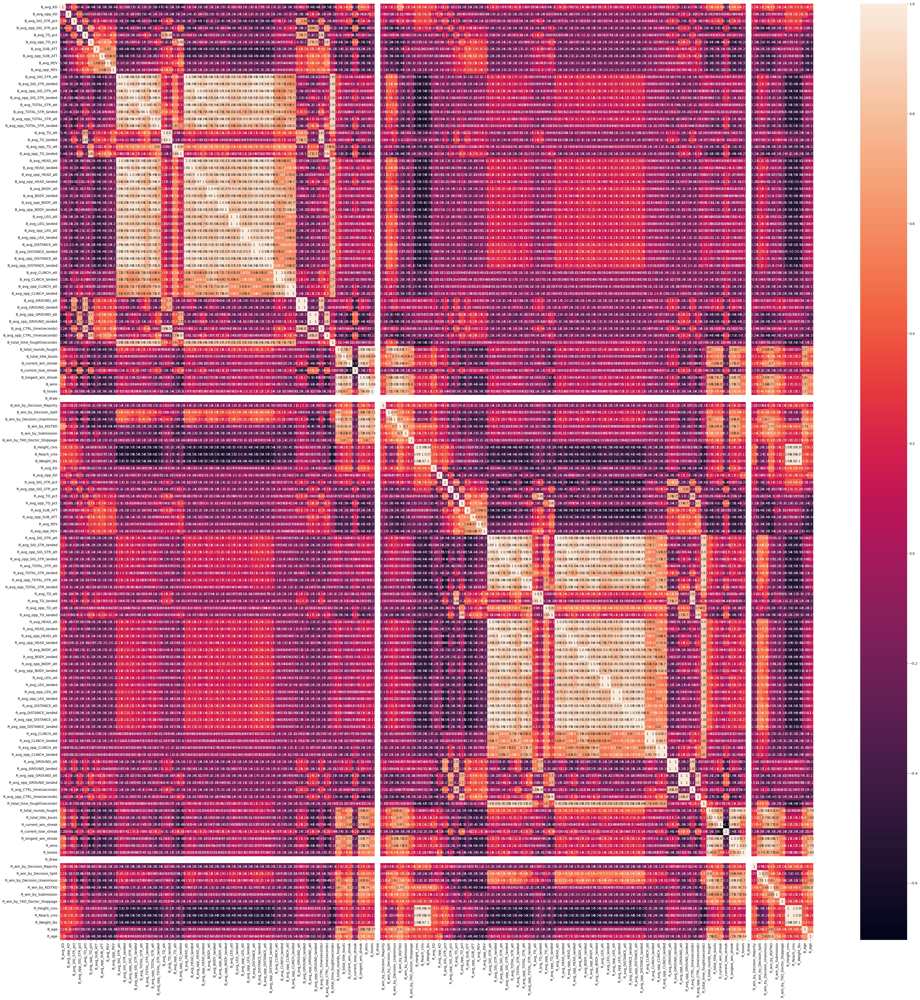

In [19]:
#Creating subplot in matplotlib, increasing size of map
fig, ax = plt.subplots(figsize=(50,50))
#Generating heatmap with coefficients in boxes
heatmap = sns.heatmap(matrix.corr(), annot = True)

In [21]:
#Saving heatmap
ufc_heatmap = heatmap.get_figure()

ufc_heatmap.savefig(os.path.join(path, '04_Analysis', 'Visualizations', 'heatmap_oop_avgs.png'), dpi = 300, bbox_inches='tight')

### It looks like there was no information in the draw sections of both Red and Blue. There may be some strong correlations, but the heat map is hard to read. I will break down the map into Red and Blue.

In [25]:
#Creating Blue subset
b_sub = df_sub.filter(regex='B_')

In [26]:
b_sub.head()

,B_avg_KD,B_avg_opp_KD,B_avg_SIG_STR_pct,B_avg_opp_SIG_STR_pct,B_avg_TD_pct,B_avg_opp_TD_pct,B_avg_SUB_ATT,B_avg_opp_SUB_ATT,B_avg_REV,B_avg_opp_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_avg_TD_att,B_avg_TD_landed,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_BODY_att,B_avg_BODY_landed,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_LEG_att,B_avg_LEG_landed,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_CTRL_time(seconds),B_avg_opp_CTRL_time(seconds),B_total_time_fought(seconds),B_total_rounds_fought,B_total_title_bouts,B_current_win_streak,B_current_lose_streak,B_longest_win_streak,B_wins,B_losses,B_draw,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_Height_cms,B_Reach_cms,B_Weight_lbs,R_avg_SUB_ATT,R_avg_opp_SUB_ATT,B_age
0,0.000,0.0,0.420000,0.49500,0.330,0.36000,0.500,1.0000,0.00,0.0,50.0000,20.0000,84.000,45.0000,76.5000,41.000,114.000,64.00,1.500,1.0,9.0,6.500,39.500,11.000,63.0000,27.500,7.5000,7.0000,12.0000,9.0000,3.000,2.000,9.000,8.500,35.0000,12.5,43.5000,17.5000,10.5000,4.5000,4.0000,3.00,4.5000,3.000,36.50,24.50,34.00,277.5000,531.5000,4,0,0,1,1,1,1,0,0,0,0,0,1,0,165.10,170.18,135,0.000000,0.00000,31
1,0.500,0.0,0.660000,0.30500,0.300,0.50000,1.500,0.0000,0.00,0.0,65.5000,35.0000,50.000,16.5000,113.5000,68.500,68.500,29.00,2.500,1.5,0.5,0.500,46.000,20.000,36.0000,7.500,12.0000,8.0000,8.0000,3.0000,7.500,7.000,6.000,6.000,58.0000,30.0,48.0000,15.5000,0.5000,0.5000,0.5000,0.50,7.0000,4.500,1.50,0.50,219.50,24.5000,577.5000,4,0,2,0,2,2,0,0,0,1,0,1,0,0,187.96,193.04,205,0.250000,1.18750,32
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,643.9375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,187.96,190.50,241,0.000000,0.25000,32
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,643.9375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,152.40,154.94,115,NaN,NaN,28
4,0.125,0.0,0.535625,0.57875,0.185,0.16625,0.125,0.1875,0.25,0.0,109.1875,57.9375,50.625,28.4375,170.4375,105.625,74.375,44.25,5.375,1.5,2.0,0.625,77.375,31.375,41.5625,22.625,31.1875,26.1875,7.6875,4.9375,0.625,0.375,1.375,0.875,33.5625,11.0,32.0625,13.9375,39.0625,28.8125,13.3125,10.75,36.5625,18.125,5.25,3.75,390.25,156.3125,764.0000,11,1,3,0,3,4,1,0,0,0,1,2,1,0,180.34,182.88,135,0.231445,0.03125,29


In [29]:
b_sub = b_sub.drop(columns=['R_avg_SUB_ATT', 'R_avg_opp_SUB_ATT'])

In [30]:
b_sub.head()

,B_avg_KD,B_avg_opp_KD,B_avg_SIG_STR_pct,B_avg_opp_SIG_STR_pct,B_avg_TD_pct,B_avg_opp_TD_pct,B_avg_SUB_ATT,B_avg_opp_SUB_ATT,B_avg_REV,B_avg_opp_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_avg_TD_att,B_avg_TD_landed,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_BODY_att,B_avg_BODY_landed,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_LEG_att,B_avg_LEG_landed,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_CTRL_time(seconds),B_avg_opp_CTRL_time(seconds),B_total_time_fought(seconds),B_total_rounds_fought,B_total_title_bouts,B_current_win_streak,B_current_lose_streak,B_longest_win_streak,B_wins,B_losses,B_draw,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_Height_cms,B_Reach_cms,B_Weight_lbs,B_age
0,0.000,0.0,0.420000,0.49500,0.330,0.36000,0.500,1.0000,0.00,0.0,50.0000,20.0000,84.000,45.0000,76.5000,41.000,114.000,64.00,1.500,1.0,9.0,6.500,39.500,11.000,63.0000,27.500,7.5000,7.0000,12.0000,9.0000,3.000,2.000,9.000,8.500,35.0000,12.5,43.5000,17.5000,10.5000,4.5000,4.0000,3.00,4.5000,3.000,36.50,24.50,34.00,277.5000,531.5000,4,0,0,1,1,1,1,0,0,0,0,0,1,0,165.10,170.18,135,31
1,0.500,0.0,0.660000,0.30500,0.300,0.50000,1.500,0.0000,0.00,0.0,65.5000,35.0000,50.000,16.5000,113.5000,68.500,68.500,29.00,2.500,1.5,0.5,0.500,46.000,20.000,36.0000,7.500,12.0000,8.0000,8.0000,3.0000,7.500,7.000,6.000,6.000,58.0000,30.0,48.0000,15.5000,0.5000,0.5000,0.5000,0.50,7.0000,4.500,1.50,0.50,219.50,24.5000,577.5000,4,0,2,0,2,2,0,0,0,1,0,1,0,0,187.96,193.04,205,32
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,643.9375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,187.96,190.50,241,32
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,643.9375,0,0,0,0,0,0,0,0,0,0,0,0,0,0,152.40,154.94,115,28
4,0.125,0.0,0.535625,0.57875,0.185,0.16625,0.125,0.1875,0.25,0.0,109.1875,57.9375,50.625,28.4375,170.4375,105.625,74.375,44.25,5.375,1.5,2.0,0.625,77.375,31.375,41.5625,22.625,31.1875,26.1875,7.6875,4.9375,0.625,0.375,1.375,0.875,33.5625,11.0,32.0625,13.9375,39.0625,28.8125,13.3125,10.75,36.5625,18.125,5.25,3.75,390.25,156.3125,764.0000,11,1,3,0,3,4,1,0,0,0,1,2,1,0,180.34,182.88,135,29


In [40]:
#Creating Red subset
r_sub = df_sub.filter(regex='R_')

In [41]:
r_sub.head()

,B_avg_SIG_STR_pct,B_avg_opp_SIG_STR_pct,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,R_avg_KD,R_avg_opp_KD,R_avg_SIG_STR_pct,R_avg_opp_SIG_STR_pct,R_avg_TD_pct,R_avg_opp_TD_pct,R_avg_SUB_ATT,R_avg_opp_SUB_ATT,R_avg_REV,R_avg_opp_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_avg_TD_att,R_avg_TD_landed,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_BODY_att,R_avg_BODY_landed,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_LEG_att,R_avg_LEG_landed,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_CTRL_time(seconds),R_avg_opp_CTRL_time(seconds),R_total_time_fought(seconds),R_total_rounds_fought,R_total_title_bouts,R_current_win_streak,R_current_lose_streak,R_longest_win_streak,R_wins,R_losses,R_draw,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_Height_cms,R_Reach_cms,R_Weight_lbs,R_age
0,0.420000,0.49500,50.0000,20.0000,84.000,45.0000,76.5000,41.000,114.000,64.00,1.000000,0.000000,0.500000,0.460000,0.000000,0.00000,0.000000,0.00000,0.00000,0.00,34.000000,17.000000,13.00000,6.000000,35.000000,18.000000,16.000000,9.000000,0.000000,0.000000,3.000000,0.000000,32.00000,15.000000,11.000000,5.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,33.000000,16.000000,12.000000,6.000000,1.000000,1.000000,1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,54.000000,166.000000,1,0,1,0,1,1,0,0,0,0,0,1,0,0,170.18,177.80,135,27
1,0.660000,0.30500,65.5000,35.0000,50.000,16.5000,113.5000,68.500,68.500,29.00,1.031250,0.062500,0.576875,0.381250,0.406250,0.11625,0.250000,1.18750,0.37500,0.25,77.562500,43.156250,69.15625,27.593750,93.125000,57.218750,98.343750,52.468750,1.281250,0.781250,4.687500,0.437500,71.09375,38.062500,50.406250,13.343750,4.687500,3.312500,9.093750,6.156250,1.781250,1.781250,9.656250,8.093750,58.312500,30.437500,63.312500,23.125000,6.968750,3.656250,5.0000,4.125000,12.281250,9.062500,0.843750,0.343750,176.156250,154.687500,747.343750,17,0,2,0,2,4,2,0,0,1,0,3,0,0,182.88,187.96,185,28
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.546875,0.187500,0.538906,0.598594,0.000000,0.31250,0.000000,0.25000,0.00000,0.00,59.234375,30.375000,43.81250,24.796875,70.500000,41.390625,50.234375,30.906250,0.031250,0.000000,2.843750,1.750000,42.50000,16.781250,34.296875,17.937500,5.781250,4.546875,6.125000,3.718750,10.953125,9.046875,3.390625,3.140625,45.875000,20.281250,36.343750,18.687500,11.328125,8.562500,1.4375,1.171875,2.031250,1.531250,6.031250,4.937500,82.453125,89.781250,448.203125,13,0,3,0,3,4,3,0,0,0,1,3,0,0,187.96,190.50,264,28
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,661.500000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,160.02,160.02,115,25
4,0.535625,0.57875,109.1875,57.9375,50.625,28.4375,170.4375,105.625,74.375,44.25,0.000000,0.000977,0.403076,0.554961,0.511719,0.62875,0.231445,0.03125,0.03125,0.50,109.331055,44.362305,148.84668,84.554688,137.154297,70.198242,172.499023,106.680664,2.261719,1.261719,3.137695,1.771484,86.37500,26.030273,94.225586,38.693359,17.272461,13.469727,37.717773,31.658203,5.683594,4.862305,16.903320,14.203125,85.845703,27.907227,106.913086,48.479492,18.996094,13.970703,35.3125,32.059570,4.489258,2.484375,6.621094,4.015625,141.

In [44]:
r_sub = r_sub.drop(columns=['B_avg_opp_SIG_STR_pct', 'B_avg_SIG_STR_att', 'B_avg_SIG_STR_landed', 'B_avg_opp_SIG_STR_att', 'B_avg_opp_SIG_STR_landed', 'B_avg_TOTAL_STR_att', 'B_avg_TOTAL_STR_landed', 'B_avg_opp_TOTAL_STR_att', 'B_avg_opp_TOTAL_STR_landed'])

In [45]:
r_sub.head()

,R_avg_KD,R_avg_opp_KD,R_avg_SIG_STR_pct,R_avg_opp_SIG_STR_pct,R_avg_TD_pct,R_avg_opp_TD_pct,R_avg_SUB_ATT,R_avg_opp_SUB_ATT,R_avg_REV,R_avg_opp_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_avg_TD_att,R_avg_TD_landed,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_BODY_att,R_avg_BODY_landed,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_LEG_att,R_avg_LEG_landed,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_CTRL_time(seconds),R_avg_opp_CTRL_time(seconds),R_total_time_fought(seconds),R_total_rounds_fought,R_total_title_bouts,R_current_win_streak,R_current_lose_streak,R_longest_win_streak,R_wins,R_losses,R_draw,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_Height_cms,R_Reach_cms,R_Weight_lbs,R_age
0,1.000000,0.000000,0.500000,0.460000,0.000000,0.00000,0.000000,0.00000,0.00000,0.00,34.000000,17.000000,13.00000,6.000000,35.000000,18.000000,16.000000,9.000000,0.000000,0.000000,3.000000,0.000000,32.00000,15.000000,11.000000,5.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,33.000000,16.000000,12.000000,6.000000,1.000000,1.000000,1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,54.000000,166.000000,1,0,1,0,1,1,0,0,0,0,0,1,0,0,170.18,177.80,135,27
1,1.031250,0.062500,0.576875,0.381250,0.406250,0.11625,0.250000,1.18750,0.37500,0.25,77.562500,43.156250,69.15625,27.593750,93.125000,57.218750,98.343750,52.468750,1.281250,0.781250,4.687500,0.437500,71.09375,38.062500,50.406250,13.343750,4.687500,3.312500,9.093750,6.156250,1.781250,1.781250,9.656250,8.093750,58.312500,30.437500,63.312500,23.125000,6.968750,3.656250,5.0000,4.125000,12.281250,9.062500,0.843750,0.343750,176.156250,154.687500,747.343750,17,0,2,0,2,4,2,0,0,1,0,3,0,0,182.88,187.96,185,28
2,0.546875,0.187500,0.538906,0.598594,0.000000,0.31250,0.000000,0.25000,0.00000,0.00,59.234375,30.375000,43.81250,24.796875,70.500000,41.390625,50.234375,30.906250,0.031250,0.000000,2.843750,1.750000,42.50000,16.781250,34.296875,17.937500,5.781250,4.546875,6.125000,3.718750,10.953125,9.046875,3.390625,3.140625,45.875000,20.281250,36.343750,18.687500,11.328125,8.562500,1.4375,1.171875,2.031250,1.531250,6.031250,4.937500,82.453125,89.781250,448.203125,13,0,3,0,3,4,3,0,0,0,1,3,0,0,187.96,190.50,264,28
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,661.500000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,160.02,160.02,115,25
4,0.000000,0.000977,0.403076,0.554961,0.511719,0.62875,0.231445,0.03125,0.03125,0.50,109.331055,44.362305,148.84668,84.554688,137.154297,70.198242,172.499023,106.680664,2.261719,1.261719,3.137695,1.771484,86.37500,26.030273,94.225586,38.693359,17.272461,13.469727,37.717773,31.658203,5.683594,4.862305,16.903320,14.203125,85.845703,27.907227,106.913086,48.479492,18.996094,13.970703,35.3125,32.059570,4.489258,2.484375,6.621094,4.015625,141.285156,310.152344,874.380859,30,0,2,0,2,5,6,0,0,0,1,2,2,0,167.64,172.72,135,43


In [47]:
#Creating correlation matrix of B_subset
b_matrix = b_sub.corr()
b_sub.corr()

,B_avg_KD,B_avg_opp_KD,B_avg_SIG_STR_pct,B_avg_opp_SIG_STR_pct,B_avg_TD_pct,B_avg_opp_TD_pct,B_avg_SUB_ATT,B_avg_opp_SUB_ATT,B_avg_REV,B_avg_opp_REV,B_avg_SIG_STR_att,B_avg_SIG_STR_landed,B_avg_opp_SIG_STR_att,B_avg_opp_SIG_STR_landed,B_avg_TOTAL_STR_att,B_avg_TOTAL_STR_landed,B_avg_opp_TOTAL_STR_att,B_avg_opp_TOTAL_STR_landed,B_avg_TD_att,B_avg_TD_landed,B_avg_opp_TD_att,B_avg_opp_TD_landed,B_avg_HEAD_att,B_avg_HEAD_landed,B_avg_opp_HEAD_att,B_avg_opp_HEAD_landed,B_avg_BODY_att,B_avg_BODY_landed,B_avg_opp_BODY_att,B_avg_opp_BODY_landed,B_avg_LEG_att,B_avg_LEG_landed,B_avg_opp_LEG_att,B_avg_opp_LEG_landed,B_avg_DISTANCE_att,B_avg_DISTANCE_landed,B_avg_opp_DISTANCE_att,B_avg_opp_DISTANCE_landed,B_avg_CLINCH_att,B_avg_CLINCH_landed,B_avg_opp_CLINCH_att,B_avg_opp_CLINCH_landed,B_avg_GROUND_att,B_avg_GROUND_landed,B_avg_opp_GROUND_att,B_avg_opp_GROUND_landed,B_avg_CTRL_time(seconds),B_avg_opp_CTRL_time(seconds),B_total_time_fought(seconds),B_total_rounds_fought,B_total_title_bouts,B_current_win_streak,B_current_lose_streak,B_longest_win_streak,B_wins,B_losses,B_draw,B_win_by_Decision_Majority,B_win_by_Decision_Split,B_win_by_Decision_Unanimous,B_win_by_KO/TKO,B_win_by_Submission,B_win_by_TKO_Doctor_Stoppage,B_Height_cms,B_Reach_cms,B_Weight_lbs,B_age
B_avg_KD,1.000000,-0.108346,0.147040,-0.165046,-0.101331,-0.167825,-0.134034,-0.105830,-0.088021,-0.103915,0.010785,0.054299,-0.069871,-0.109096,-0.057090,-0.068133,-0.123944,-0.177522,-0.218568,-0.162387,-0.039585,-0.129034,0.017889,0.081259,-0.066692,-0.112356,-0.015574,-0.006309,-0.067240,-0.082180,-0.010349,-0.002657,-0.035755,-0.040555,0.004019,0.053578,-0.030144,-0.044750,-0.014098,-0.017280,-0.076659,-0.090095,0.050071,0.041987,-0.153589,-0.153454,-0.158483,-0.181184,-0.163035,0.040798,-0.002706,0.124015,-0.100924,0.185393,0.132454,-0.043286,NaN,-0.000036,-0.010669,0.002775,0.311249,-0.065854,0.020805,0.099073,0.111177,0.109418,-0.003593
B_avg_opp_KD,-0.108346,1.000000,-0.131048,0.195536,-0.086833,-0.046862,-0.082928,-0.058428,-0.044906,-0.049158,-0.075047,-0.105919,-0.005021,0.053807,-0.112742,-0.148483,-0.044479,-0.025455,-0.024615,-0.071712,-0.159624,-0.105398,-0.065704,-0.094509,0.001574,0.081140,-0.081023,-0.090482,-0.020907,-0.002252,-0.056634,-0.062314,-0.022435,-0.004772,-0.043609,-0.053925,-0.022714,0.032906,-0.070516,-0.087696,0.009128,0.011777,-0.122267,-0.123419,0.079781,0.072663,-0.117412,-0.091241,-0.140159,0.041301,0.058820,-0.031278,0.095237,-0.035876,0.005644,0.146587,NaN,0.009601,0.026237,-0.017556,0.016697,-0.002485,0.009391,0.104758,0.086452,0.086298,0.120764
B_avg_SIG_STR_pct,0.147040,-0.131048,1.000000,-0.022329,0.147924,-0.088363,0.056088,-0.005228,0.024418,0.011477,-0.132209,0.125456,-0.189792,-0.166823,-0.055879,0.189120,-0.166155,-0.109225,0.044113,0.129616,-0.027257,-0.069062,-0.173524,0.101788,-0.197803,-0.179601,0.049528,0.148449,-0.085209,-0.063748,0.019241,0.057659,-0.111496,-0.106344,-0.219061,-0.036174,-0.187935,-0.174641,0.164318,0.231962,0.035511,0.044348,0.269291,0.332274,-0.083505,-0.086578,0.209828,-0.021437,-0.071782,-0.003138,0.021810,0.111901,-0.150686,0.108894,0.070403,-0.087027,NaN,0.031076,-0.075666,0.023318,0.121726,0.025207,0.018859,0.098940,0.078183,0.115055,0.022122
B_avg_opp_SIG_STR_pct,-0.165046,0.195536,-0.022329,1.000000,-0.104721,0.205027,0.015325,0.096689,0.063783,0.044984,-0.191490,-0.165435,-0.121200,0.140937,-0.172553,-0.117528,-0.035619,0.226183,-0.043808,-0.096388,0.032837,0.165708,-0.197530,-0.174588,-0.150281,0.144364,-0.087442,-0.066794,0.026133,0.131117,-0.107216,-0.102443,-0.020391,0.028111,-0.187019,-0.174424,-0.210589,-0.026865,0.024906,0.040304,0.146981,0.209723,-0.097997,-0.082365,0.299000,0.360791,-0.039405,0.245426,-0.091543,-0.061716,-0.014184,-0.137936,0.165609,-0.163491,-0.112970,0.076696,NaN,-0.008263,-0.069080,-0.126060,-0.075821,-0.017391,-0.042798,0.070630,0.064821,0.077211,0.057093
B_avg_TD_pct,-0.101331,-0.086833,0.147924,-0.104721,1.000000,-0.135316,0.184161,0.102491,0.054036,0.205749,-0.015315,0.04

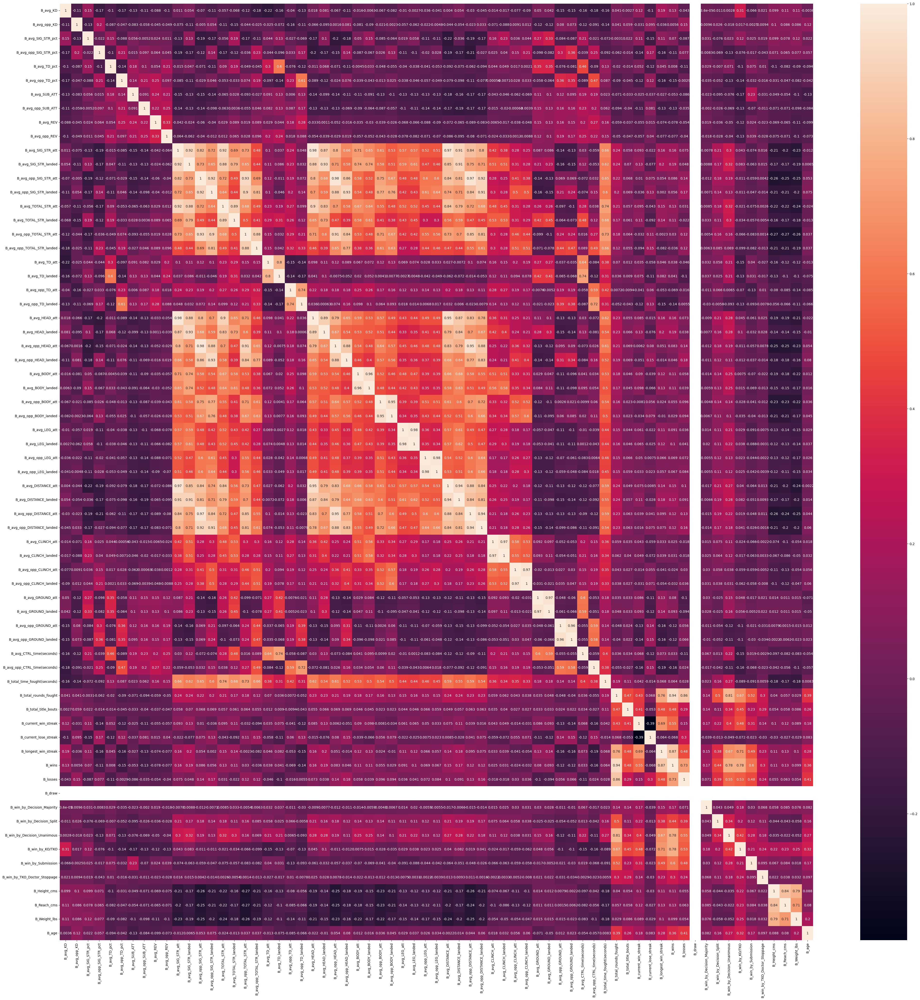

In [54]:
#Creating subplot in matplotlib, increasing size of map
fig, ax = plt.subplots(figsize=(50,50))
#Generating heatmap with coefficients in boxes
b_heatmap = sns.heatmap(b_sub.corr(), annot = True)

In [61]:
#Saving heatmap
b_heatmap.savefig(os.path.join(path, '04_Analysis', 'Visualizations', 'B_heatmap.png'), dpi = 300, bbox_inches='tight')

In [56]:
#Creating correlation matrix of R_subset
r_matrix = r_sub.corr()
r_sub.corr()

,R_avg_KD,R_avg_opp_KD,R_avg_SIG_STR_pct,R_avg_opp_SIG_STR_pct,R_avg_TD_pct,R_avg_opp_TD_pct,R_avg_SUB_ATT,R_avg_opp_SUB_ATT,R_avg_REV,R_avg_opp_REV,R_avg_SIG_STR_att,R_avg_SIG_STR_landed,R_avg_opp_SIG_STR_att,R_avg_opp_SIG_STR_landed,R_avg_TOTAL_STR_att,R_avg_TOTAL_STR_landed,R_avg_opp_TOTAL_STR_att,R_avg_opp_TOTAL_STR_landed,R_avg_TD_att,R_avg_TD_landed,R_avg_opp_TD_att,R_avg_opp_TD_landed,R_avg_HEAD_att,R_avg_HEAD_landed,R_avg_opp_HEAD_att,R_avg_opp_HEAD_landed,R_avg_BODY_att,R_avg_BODY_landed,R_avg_opp_BODY_att,R_avg_opp_BODY_landed,R_avg_LEG_att,R_avg_LEG_landed,R_avg_opp_LEG_att,R_avg_opp_LEG_landed,R_avg_DISTANCE_att,R_avg_DISTANCE_landed,R_avg_opp_DISTANCE_att,R_avg_opp_DISTANCE_landed,R_avg_CLINCH_att,R_avg_CLINCH_landed,R_avg_opp_CLINCH_att,R_avg_opp_CLINCH_landed,R_avg_GROUND_att,R_avg_GROUND_landed,R_avg_opp_GROUND_att,R_avg_opp_GROUND_landed,R_avg_CTRL_time(seconds),R_avg_opp_CTRL_time(seconds),R_total_time_fought(seconds),R_total_rounds_fought,R_total_title_bouts,R_current_win_streak,R_current_lose_streak,R_longest_win_streak,R_wins,R_losses,R_draw,R_win_by_Decision_Majority,R_win_by_Decision_Split,R_win_by_Decision_Unanimous,R_win_by_KO/TKO,R_win_by_Submission,R_win_by_TKO_Doctor_Stoppage,R_Height_cms,R_Reach_cms,R_Weight_lbs,R_age
R_avg_KD,1.000000,-0.104576,0.161472,-0.161361,-0.139673,-0.137887,-0.122500,-0.115235,-0.110424,-0.115041,-0.008920,0.034195,-0.071296,-0.107723,-0.070456,-0.073771,-0.119690,-0.168985,-0.244826,-0.198634,-0.026164,-0.107731,-0.002966,0.059884,-0.065702,-0.102365,-0.022745,-0.018638,-0.087057,-0.105894,-0.019106,-0.008871,-0.029447,-0.037156,-0.008058,0.041339,-0.034414,-0.048102,-0.048968,-0.039949,-0.103019,-0.112106,0.031468,0.024638,-0.131204,-0.135817,-0.186340,-0.149278,-0.166869,-0.019240,0.031666,0.096255,-0.101657,0.100878,0.064547,-0.077329,NaN,-0.028309,-0.061857,-0.048944,0.260579,-0.087827,0.014054,0.104607,0.123745,0.112146,-0.014551
R_avg_opp_KD,-0.104576,1.000000,-0.156009,0.124963,-0.148663,-0.082341,-0.097869,-0.058833,-0.062577,-0.047172,-0.056210,-0.096826,0.031813,0.061214,-0.099850,-0.149078,-0.014530,-0.027179,-0.043771,-0.119201,-0.175158,-0.147147,-0.045147,-0.085421,0.047492,0.101003,-0.071865,-0.088846,-0.022482,-0.020053,-0.052419,-0.054427,-0.029716,-0.022280,-0.019155,-0.037810,0.019962,0.048226,-0.099461,-0.107476,-0.016226,-0.014052,-0.112368,-0.114846,0.085965,0.080016,-0.130367,-0.115389,-0.126172,0.096804,0.052466,0.015816,0.040331,0.039923,0.076545,0.171892,NaN,0.023021,0.037562,0.042088,0.085084,0.011918,0.039998,0.099318,0.084722,0.097750,0.153904
R_avg_SIG_STR_pct,0.161472,-0.156009,1.000000,0.034117,0.173470,-0.118201,0.069012,-0.031926,0.025016,0.007645,-0.195090,0.084183,-0.248638,-0.215314,-0.113202,0.162437,-0.230794,-0.161640,0.009683,0.109957,-0.062263,-0.102384,-0.236071,0.073151,-0.249751,-0.208172,-0.004378,0.096803,-0.138628,-0.112567,-0.013758,0.030079,-0.167234,-0.167031,-0.280045,-0.082650,-0.247833,-0.227458,0.125853,0.197689,0.009399,0.024094,0.273383,0.342619,-0.079223,-0.077151,0.204958,-0.043881,-0.136553,-0.064265,0.059783,0.093697,-0.151642,0.054006,0.015232,-0.135198,NaN,0.025671,-0.123012,-0.042059,0.089453,0.022971,0.013328,0.132440,0.138494,0.141745,-0.012507
R_avg_opp_SIG_STR_pct,-0.161361,0.124963,0.034117,1.000000,-0.096476,0.197246,0.031095,0.088642,0.038384,0.060241,-0.159751,-0.133657,-0.094390,0.166753,-0.134695,-0.081484,-0.024211,0.223587,-0.026044,-0.080817,0.017598,0.140929,-0.163064,-0.136052,-0.121117,0.167005,-0.062240,-0.039646,0.043065,0.152919,-0.115811,-0.112280,-0.009682,0.043638,-0.158557,-0.144086,-0.176029,0.018332,0.045271,0.054895,0.173444,0.239596,-0.070820,-0.063446,0.268283,0.328596,-0.025099,0.237384,-0.077165,-0.008311,-0.030731,-0.076776,0.119790,-0.098992,-0.046093,0.122086,NaN,0.034889,-0.025609,-0.101428,-0.004166,0.007431,-0.003574,0.107985,0.086175,0.110263,0.070641
R_avg_TD_pct,-0.139673,-0.148663,0.173470,-0.096476,1.000000,-0.097311,0.247504,0.130840,0.117545,0.225852,-0.065287,0.001

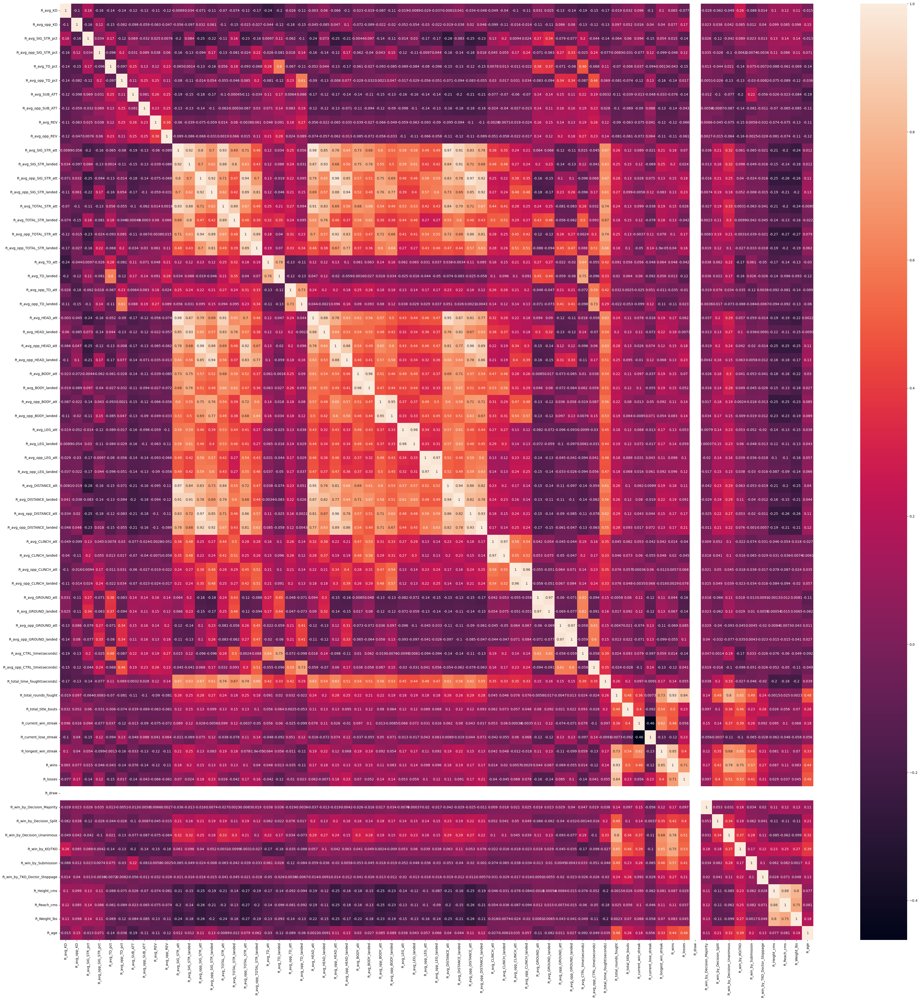

In [57]:
#Creating subplot in matplotlib, increasing size of map
fig, ax = plt.subplots(figsize=(50,50))
#Generating heatmap with coefficients in boxes
r_heatmap = sns.heatmap(r_sub.corr(), annot = True)

In [62]:
#Saving heatmap
r_heatmap.savefig(os.path.join(path, '04_Analysis', 'Visualizations', 'R_heatmap.png'), dpi = 300, bbox_inches='tight')

### There are other correlations found, like between distance and strikes landed, but they do not seem to be correlated with wins. There is the same correlation between wins and number of rounds fought, but these maps also show a correlation of around 0.7 betweens wins, win by knockout, and win by submission. These types of wins may be the most effective.

## 05. Scatterplots of Strong Correlation Variables With Wins

### Blue Corner Charts:

C:\Users\Mosspants\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


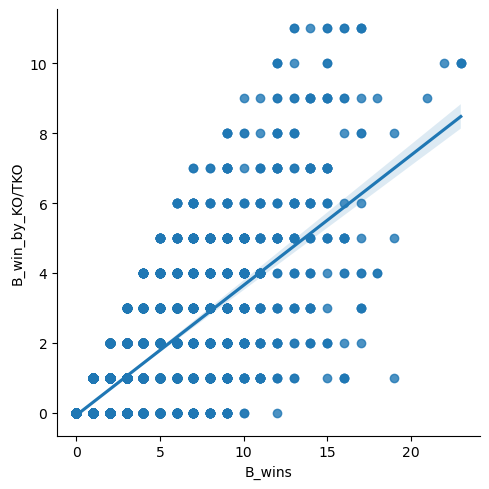

In [63]:
#Scatterplot of B_win_by_KO/TKO and B_wins
b_winscatter = sns.lmplot(y = 'B_win_by_KO/TKO', x = 'B_wins', data = df_ufc)
#Saving scatterplot
plt.savefig(os.path.join(path, '04_Analysis', 'Visualizations', 'b_win_ko_tko.png'), dpi = 300, bbox_inches='tight')

### The data points do not seem to cluster around the line. Some of the highest win counts have low knockout wins, but those with the highest knockout wins have 10+ wins in general.

C:\Users\Mosspants\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


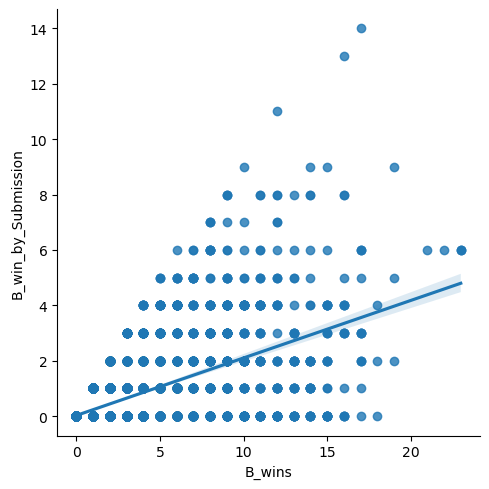

In [64]:
#Scatterplot of B_win_by_Submission and B_wins
b_winscatter = sns.lmplot(y = 'B_win_by_Submission', x = 'B_wins', data = df_ufc)
#Saving scatterplot
plt.savefig(os.path.join(path, '04_Analysis', 'Visualizations', 'b_win_submission.png'), dpi = 300, bbox_inches='tight')

### These data points also don't cluster around the trend line. We are seeing a similar pattern where those with the most submissions have higher total win counts, but there are also those with less submissions are more wins.

### Red Corner Charts:

C:\Users\Mosspants\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


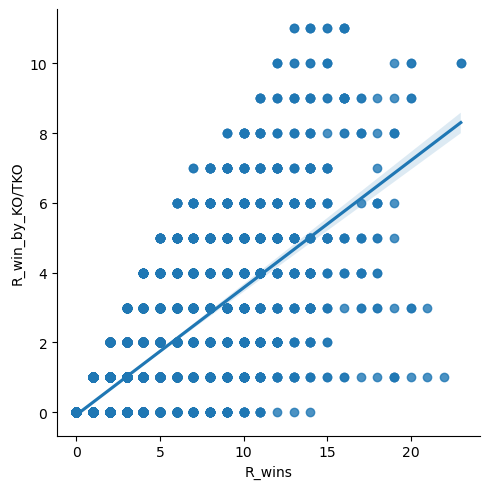

In [65]:
#Scatterplot of R_win_by_KO/TKO and R_wins
b_winscatter = sns.lmplot(y = 'R_win_by_KO/TKO', x = 'R_wins', data = df_ufc)
#Saving scatterplot
plt.savefig(os.path.join(path, '04_Analysis', 'Visualizations', 'r_win_ko_tko.png'), dpi = 300, bbox_inches='tight')

C:\Users\Mosspants\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


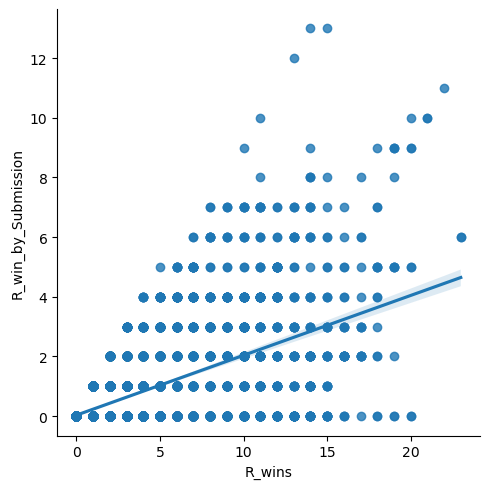

In [66]:
#Scatterplot of R_win_by_Submission and R_wins
b_winscatter = sns.lmplot(y = 'R_win_by_Submission', x = 'R_wins', data = df_ufc)
#Saving scatterplot
plt.savefig(os.path.join(path, '04_Analysis', 'Visualizations', 'r_win_submission.png'), dpi = 300, bbox_inches='tight')

### The scatterplots for the Red side also follow the same trends. 

### Because these findings are similar to the previous ones, I will keep the same hypothesis for now:

### Fighters that are in more rounds have more wins. If a fighter is in more rounds, then they have more matches and more experience.

### It has the strongest correlation, but this larger data set would be more beneficial because we can get a more detailed look at the fights. I will create the same age group for this data set as the previous one, and use it in future tasks.

## 06. Age Categories

In [67]:
#Based on spread of ages I will create 3 age categories:
#Age 18-26 Blue = Younger
df_ufc.loc[(df_ufc['B_age'] < 27), 'Age_group'] = 'Younger'

In [68]:
#Age 27-33 Blue = Middle
df_ufc.loc[(df_ufc['B_age'] >= 27) & (df_ufc['B_age'] < 34), 'Age_group'] = 'Middle'

In [69]:
#Age 34-47 Blue = Older
df_ufc.loc[(df_ufc['B_age'] >= 34) & (df_ufc['R_age'] >= 34), 'Age_group'] = 'Older'

In [70]:
#Age 18-26 Red = Young
df_ufc.loc[(df_ufc['R_age'] < 27), 'Age_group'] = 'Younger'

In [71]:
#Age 27-33 Red = Middle
df_ufc.loc[(df_ufc['R_age'] >= 27) & (df_ufc['R_age'] < 34), 'Age_group'] = 'Middle'

In [72]:
#Age 34-47 Red = Older
df_ufc.loc[(df_ufc['R_age'] >= 34) & (df_ufc['R_age'] >= 34), 'Age_group'] = 'Older'

In [73]:
#Checking Age_group
df_ufc['Age_group'].value_counts(dropna = False)

Age_group
Middle     3380
Younger    1406
Older      1023
Name: count, dtype: int64

## 07. Exporting Data

In [74]:
#Exporting dataframe with new group and age datatype changes
df_ufc.to_csv(os.path.join(path, '02_Data', 'Prepared_Data', 'ufc_opp_avgs_eva.csv'))